# Obiettivi
## 1. Analisi Descrittiva dei Contenuti

Il primo obiettivo del progetto è condurre un'analisi esplorativa dei dati (EDA) per capire le caratteristiche dei contenuti di Wikipedia suddivisi in diverse categorie tematiche, come ad esempio: - Cultura, Economia, Medicina, Tecnologia, Politica, Scienza, e altre.

L'analisi esplorativa prevede: - Il conteggio degli articoli presenti per ogni categoria. - Il numero medio di parole per articolo. - La lunghezza dell'articolo più lungo e di quello più corto per ciascuna categoria. - La creazione di nuvole di parole rappresentative per ogni categoria, per identificare i termini più frequenti e rilevanti.

## 2. Sviluppo di un Classificatore Automatico

Il secondo obiettivo è creare un modello di machine learning capace di classificare automaticamente gli articoli in base alla loro categoria. Il sistema di classificazione verrà addestrato utilizzando dati di testo presenti nelle seguenti colonne del dataset: - Sommario (summary): Introduzione breve dell'articolo. - Testo Completo (documents): Contenuto completo dell'articolo.

## 3. Identificazione di Nuovi Insights

L'analisi consentirà anche di ottenere preziosi insights sui contenuti di Wikipedia, come la densità di articoli per categoria o le tendenze linguistiche associate a determinati argomenti. Queste informazioni possono aiutare Wikimedia a migliorare l'organizzazione delle pagine e a ottimizzare i propri sforzi editoriali.

In [0]:
%pip install wordcloud

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
%pip install langdetect

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
import pandas as pd

# graphic modules
import matplotlib.pyplot as plt
import seaborn as sns

from wordcloud import WordCloud
from langdetect import detect

# pyspark SQL
from pyspark.sql import SparkSession
from pyspark.sql.functions import length, min, max,avg, round,concat_ws,regexp_replace, lower,expr,udf
from pyspark.sql.types import StringType
# pyspark ML
from pyspark.ml.feature import CountVectorizer, StringIndexer,StandardScaler,Tokenizer, StopWordsRemover
from pyspark.ml.classification import RandomForestClassifier,LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml import Pipeline

# IMPORTAZIONE DEL DATASET

## Conversione in Spark dataframe

In [0]:
# Initialize SparkSession if not already active
spark = SparkSession.builder.appName("Wikipedia_Analysis").getOrCreate()

In [0]:
spark_df = spark.read.table("workspace.default.wikipedia")

# ANALISI DEL DATASET

## Visualizazione contenuto e tipo dati

In [0]:
spark_df.printSchema()

root
 |-- title: string (nullable = true)
 |-- summary: string (nullable = true)
 |-- documents: string (nullable = true)
 |-- categoria: string (nullable = true)



In [0]:
spark_df.show(10)


+--------------------+--------------------+--------------------+---------+
|               title|             summary|           documents|categoria|
+--------------------+--------------------+--------------------+---------+
|    foxhall p. keene|foxhall parker ke...|foxhall parker ke...|   sports|
|thomas william ki...|thomas william ki...|thomas william ki...|   sports|
|    rene la montagne|rene morgan la mo...|rene morgan la mo...|   sports|
|         lewis lacey|lewis lawrence la...|lewis lawrence la...|   sports|
| malcolm orme little|brigadier-general...|brigadier-general...|   sports|
| john hardress-lloyd|brigadier-general...|brigadier-general...|   sports|
|      vivian lockett|vivian noverre lo...|vivian noverre lo...|   sports|
|         tim melvill|teignmouth philip...|teignmouth philip...|   sports|
|    devereux milburn|devereux milburn ...|devereux milburn ...|   sports|
|charles darley mi...|charles darley mi...|charles darley mi...|   sports|
+--------------------+---

## Distribuzione delle categorie degli articoli

In [0]:
spark_df.createOrReplaceTempView("wikipedia_articles")

category_counts = spark.sql("SELECT categoria, COUNT(*) AS numero_articoli FROM wikipedia_articles GROUP BY categoria ORDER BY numero_articoli DESC")

category_counts.show(truncate=False)

+-----------+---------------+
|categoria  |numero_articoli|
+-----------+---------------+
|politics   |11358          |
|culture    |10372          |
|science    |10236          |
|humanities |10236          |
|engineering|10220          |
|finance    |10157          |
|transport  |10130          |
|economics  |10110          |
|technology |10095          |
|medicine   |10076          |
|sports     |10068          |
|trade      |10068          |
|energy     |10046          |
|research   |10037          |
|pets       |10023          |
+-----------+---------------+



Le **categorie** sono equamente distribuite all'interno dei vari articoli

## Rappresentazione occorenze delle categorie negli articoli

In [0]:
# Create a dictionary of category frequencies
category_frequency = {row['categoria']: row['numero_articoli'] for row in category_counts.collect()}

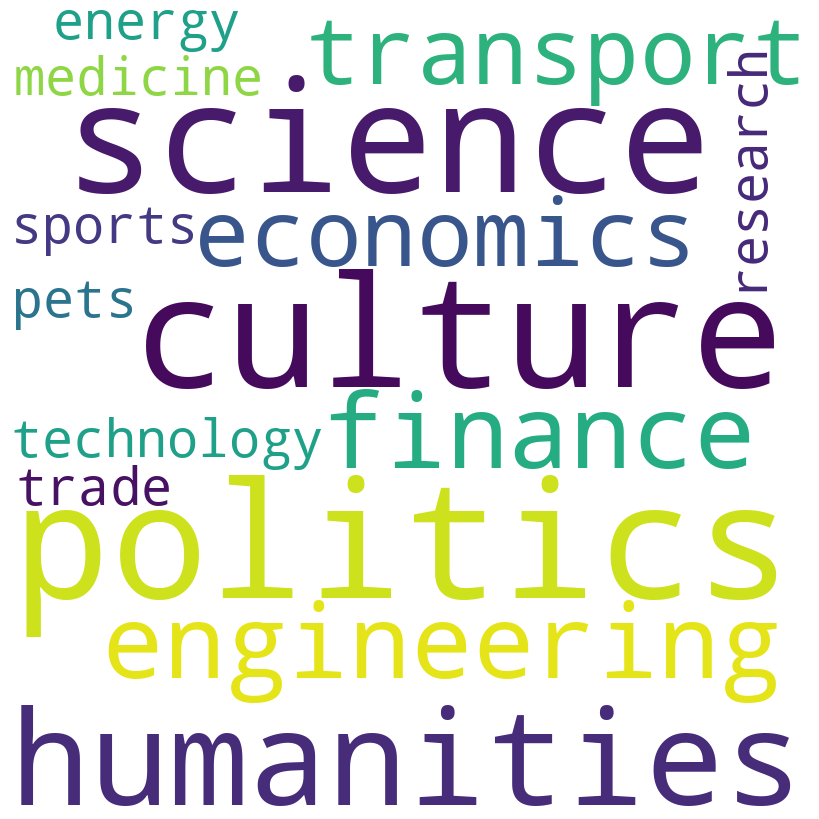

In [0]:
# Generate the word cloud
wordcloud = WordCloud(
    width = 800, height = 800,
    background_color ='white',
    min_font_size = 10).generate_from_frequencies(category_frequency)

# Display the word cloud
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

## Analisi della lunghezza degli articoli per categoria

In [0]:
## Add column with length of documents
spark_df = spark_df.withColumn("document_length", length(spark_df["documents"]))

In [0]:
avg_length = spark_df.select(round(avg("document_length"))).collect()[0][0]

print('La lungheza media degli articoli è di: ' + str(avg_length) + ' caratteri')

La lungheza media degli articoli è di: 5881.0 caratteri


In [0]:
spark_df.groupBy("categoria").agg(
    min("document_length").alias("Min length"),
    max("document_length").alias("Max length"),
    round(avg("document_length")).alias("Average length")
).show(truncate=False)

+-----------+----------+----------+--------------+
|categoria  |Min length|Max length|Average length|
+-----------+----------+----------+--------------+
|research   |116       |158762    |4644.0        |
|medicine   |76        |119361    |5104.0        |
|engineering|50        |77579     |4537.0        |
|sports     |90        |115092    |3621.0        |
|science    |81        |177114    |11803.0       |
|transport  |57        |135535    |3893.0        |
|technology |29        |115154    |5592.0        |
|humanities |56        |135319    |6619.0        |
|finance    |7         |190204    |11724.0       |
|trade      |100       |121240    |3950.0        |
|pets       |71        |81386     |2585.0        |
|energy     |60        |146236    |3703.0        |
|culture    |70        |102337    |4064.0        |
|economics  |67        |150009    |6339.0        |
|politics   |77        |128393    |9614.0        |
+-----------+----------+----------+--------------+



# SVILUPPO DI UN CLASSIFICATORE AUTOMATICO

### Creazione unica colonna con tutto il testo da analizzare

In [0]:
# Combine 'title', 'summary', and 'documents' columns into a new column 'combined_text'
spark_df = spark_df.withColumn(
    "combined_text",
    concat_ws(" ", spark_df["title"], spark_df["summary"], spark_df["summary"])
)

In [0]:
display(spark_df.select("combined_text","categoria"))

combined_text,categoria
"foxhall p. keene foxhall parker keene (december 18, 1867 – september 25, 1941) was an american thoroughbred race horse owner and breeder, a world and olympic gold medallist in polo and an amateur tennis player. he was rated the best all-around polo player in the united states for eight consecutive years, a golfer who competed in the u.s. open, and a pioneer racecar driver who vied for the gordon bennett cup. in addition to his substantial involvement in flat racing, he was also a founding member of the national steeplechase association. foxhall parker keene (december 18, 1867 – september 25, 1941) was an american thoroughbred race horse owner and breeder, a world and olympic gold medallist in polo and an amateur tennis player. he was rated the best all-around polo player in the united states for eight consecutive years, a golfer who competed in the u.s. open, and a pioneer racecar driver who vied for the gordon bennett cup. in addition to his substantial involvement in flat racing, he was also a founding member of the national steeplechase association.",sports
thomas william kirkwood thomas william kirkwood (1884–1971) was a scottish champion polo player. he competed in the 1924 international polo cup. thomas william kirkwood (1884–1971) was a scottish champion polo player. he competed in the 1924 international polo cup.,sports
"rene la montagne rene morgan la montagne jr. (december 23, 1882 – ?) was an american polo player who in 1914 won the international polo cup. rene morgan la montagne jr. (december 23, 1882 – ?) was an american polo player who in 1914 won the international polo cup.",sports
"lewis lacey lewis lawrence lacey (february 17, 1887 – november 1966) was a canadian polo player. lewis lawrence lacey (february 17, 1887 – november 1966) was a canadian polo player.",sports
"malcolm orme little brigadier-general malcolm orme little, (29 november 1857 – 1 february 1931) was a cavalry officer in the british army and champion polo player. he commanded a cavalry brigade in the second boer war and a yeomanry brigade in the first world war. brigadier-general malcolm orme little, (29 november 1857 – 1 february 1931) was a cavalry officer in the british army and champion polo player. he commanded a cavalry brigade in the second boer war and a yeomanry brigade in the first world war.",sports
john hardress-lloyd brigadier-general john hardress lloyd (14 august 1874 – 28 february 1952) was an anglo-irish soldier and polo player. he was awarded a dso and made a chevalier of the légion d’honneur for his service in the british army during the first world war. as a polo player he won a silver medal with the ireland team at the 1908 summer olympics. brigadier-general john hardress lloyd (14 august 1874 – 28 february 1952) was an anglo-irish soldier and polo player. he was awarded a dso and made a chevalier of the légion d’honneur for his service in the british army during the first world war. as a polo player he won a silver medal with the ireland team at the 1908 summer olympics.,sports
"vivian lockett vivian noverre lockett (18 july 1880 – 30 may 1962) was a colonel in the british army, and a 10 goal handicap player. he won a gold medal for the united kingdom at the 1920 summer olympics in antwerp. vivian noverre lockett (18 july 1880 – 30 may 1962) was a colonel in the british army, and a 10 goal handicap player. he won a gold medal for the united kingdom at the 1920 summer olympics in antwerp.",sports
tim melvill teignmouth philip melvill (13 february 1877 – 12 december 1951) was an english champion polo player. teignmouth philip melvill (13 february 1877 – 12 december 1951) was an english champion polo player.,sports
"devereux milburn devereux milburn (september 19, 1881 – august 15, 1942) was an american champion polo player in the early to mid twentieth century. he was one of a group of americans known as the big four in international polo, winning the westchester cup six times. he is ""remembered as 

## Creazione del dataset di test e di training

In [0]:
train,test = spark_df.randomSplit([0.7,0.3], seed=0)

In [0]:
print("Training Dataset Count: " + str(train.count()))
print("Test Dataset Count: " + str(test.count()))

Training Dataset Count: 107274
Test Dataset Count: 45958


## Preparazione dataset di training

In [0]:
# Remove parentheses, punctuation, numbers, and special characters from combined_text
train = train.withColumn(
    "clean_text",
    lower(regexp_replace(train["combined_text"], r"[\(\)\[\]\{\},.;:'\"!?@#$%^&*_+=<>|\\/~`0-9]", ""))
)

In [0]:
# Tokenize the combined_text column
tokenizer = Tokenizer(inputCol="clean_text", outputCol="tokens")
#train_tokenized = tokenizer.transform(train)

# stop words
add_stopwords = ["http","https","amp","rt","t","c","the"]
# Remove stop words
remover = StopWordsRemover(inputCol="tokens", outputCol="filtered_tokens").setStopWords(add_stopwords)
#train_no_stopwords = remover.transform(train_tokenized)

In [0]:
pipelineData = Pipeline(stages=[tokenizer, remover])

In [0]:
pipelineDataFit = pipelineData.fit(train)
train_no_stopwords = pipelineDataFit.transform(train)

In [0]:
# Remove empty elements from filtered_tokens
train_no_stopwords = train_no_stopwords.withColumn(
    "filtered_tokens",
    expr("filter(filtered_tokens, x -> x != '')")
)

## Creazione pipeline e addestramento del modello

In [0]:
# Convert filtered tokens to feature vectors
vectorizer = CountVectorizer(inputCol="filtered_tokens", outputCol="vector", vocabSize = 7000, minDF=0.01,maxDF=0.7)
# Scale the feature vectors
scaler = StandardScaler(inputCol="vector",outputCol="features")

# Index the target column
label_indexer = StringIndexer(inputCol="categoria", outputCol="label")

# Build pipeline
pipeline = Pipeline(stages=[vectorizer, scaler, label_indexer])

In [0]:
pipelineFit = pipeline.fit(train_no_stopwords)
dataset = pipelineFit.transform(train_no_stopwords)

### Logistic regretion model

In [0]:
lr = LogisticRegression(maxIter=20, regParam=0.3, elasticNetParam=0)

In [0]:
lrModel = lr.fit(dataset)

### Random forest model

In [0]:
# Random Forest classifier
rf = RandomForestClassifier(featuresCol="features", labelCol="label", numTrees=100, maxDepth = 4,
                            maxBins = 32)

In [0]:
rfModel = rf.fit(dataset)

## Predizioni

In [0]:
test_clean = test.withColumn(
    "clean_text",
    lower(regexp_replace(test["combined_text"], r"[\(\)\[\]\{\},.;:'\"!?@#$%^&*_+=<>|\\/~`0-9]", ""))
)

In [0]:
# Transform the test set using the fitted pipeline to generate 'features' and 'label'
test_no_stopword = pipelineDataFit.transform(test_clean)

In [0]:
test_dataset = pipelineFit.transform(test_no_stopword)

In [0]:
rfPredictions = rfModel.transform(test_dataset)

display(rfPredictions.select("combined_text", "label", "prediction"))

combined_text,label,prediction
"maria magdalena ""(i'll never be) maria magdalena"", also known simply as ""maria magdalena"", is a song recorded by german singer sandra for her debut studio album the long play (1985). the song, written by hubert kemmler, markus löhr, michael cretu and richard palmer-james, was released as the lead single from the long play on 15 july 1985 by virgin records, and was a major chart hit in europe, reaching number one in multiple countries. it remains sandra's signature song. ""(i'll never be) maria magdalena"", also known simply as ""maria magdalena"", is a song recorded by german singer sandra for her debut studio album the long play (1985). the song, written by hubert kemmler, markus löhr, michael cretu and richard palmer-james, was released as the lead single from the long play on 15 july 1985 by virgin records, and was a major chart hit in europe, reaching number one in multiple countries. it remains sandra's signature song.",9.0,5.0
"'twas the night 'twas the night is a 2001 disney channel original movie directed by nick castle and starring josh zuckerman, brenda grate, bryan cranston and jefferson mappin. it was released in december for the christmas holiday. disney channel has aired the film every year sometime in december. 'twas the night is a 2001 disney channel original movie directed by nick castle and starring josh zuckerman, brenda grate, bryan cranston and jefferson mappin. it was released in december for the christmas holiday. disney channel has aired the film every year sometime in december.",9.0,1.0
"1847 north american typhus epidemic the typhus epidemic of 1847 was an outbreak of epidemic typhus caused by a massive irish emigration in 1847, during the great famine, aboard crowded and disease-ridden ""coffin ships"". the typhus epidemic of 1847 was an outbreak of epidemic typhus caused by a massive irish emigration in 1847, during the great famine, aboard crowded and disease-ridden ""coffin ships"".",9.0,5.0
"1941 german supercup the 1941 german supercup, known as the herausforderungskampf (english: challenge match), was an unofficial edition of the german supercup, a football match contested by the winners of the previous season's german football championship and tschammerpokal competitions. the match was played at the dsc-stadion in dresden, and contested by 1940 german football champions schalke 04 and cup winners dresdner sc. dresden won the match 4–2 to claim the unofficial title. the 1941 german supercup, known as the herausforderungskampf (english: challenge match), was an unofficial edition of the german supercup, a football match contested by the winners of the previous season's german football championship and tschammerpokal competitions. the match was played at the dsc-stadion in dresden, and contested by 1940 german football champions schalke 04 and cup winners dresdner sc. dresden won the match 4–2 to claim the unofficial title.",5.0,11.0
"1943 german football championship final the 1943 german football championship, the 36th edition of the competition, was won by dresdner sc, the club's first-ever championship, won by defeating fv saarbrücken in the final.the twenty-nine 1942–43 gauliga champions, four more than in the previous season, competed in a single-leg knock out competition to determine the national champion. in the following season, the last completed one during the war, the german championship was played with thirty one clubs, expanded through a combination of territorial expansion of nazi germany and the sub-dividing of the gauligas in later years.the 1943 championship marked the end of the golden era of schalke 04 which had reached the semi-finals of each edition of the national championship from 1932 to 1942 and won the competition in 1934, 1935, 1937, 1939, 1940 and 1942 while losing the final in 1933, 1938 and 1941. in 1943 defending champions schalke was knocked out in the quarter-finals by holstein kiel, thereby ending the clubs quest for a twelfth

In [0]:
lrPredictions = lrModel.transform(test_dataset)

display(lrPredictions.select("combined_text", "label", "prediction"))

combined_text,label,prediction
"maria magdalena ""(i'll never be) maria magdalena"", also known simply as ""maria magdalena"", is a song recorded by german singer sandra for her debut studio album the long play (1985). the song, written by hubert kemmler, markus löhr, michael cretu and richard palmer-james, was released as the lead single from the long play on 15 july 1985 by virgin records, and was a major chart hit in europe, reaching number one in multiple countries. it remains sandra's signature song. ""(i'll never be) maria magdalena"", also known simply as ""maria magdalena"", is a song recorded by german singer sandra for her debut studio album the long play (1985). the song, written by hubert kemmler, markus löhr, michael cretu and richard palmer-james, was released as the lead single from the long play on 15 july 1985 by virgin records, and was a major chart hit in europe, reaching number one in multiple countries. it remains sandra's signature song.",9.0,5.0
"'twas the night 'twas the night is a 2001 disney channel original movie directed by nick castle and starring josh zuckerman, brenda grate, bryan cranston and jefferson mappin. it was released in december for the christmas holiday. disney channel has aired the film every year sometime in december. 'twas the night is a 2001 disney channel original movie directed by nick castle and starring josh zuckerman, brenda grate, bryan cranston and jefferson mappin. it was released in december for the christmas holiday. disney channel has aired the film every year sometime in december.",9.0,1.0
"1847 north american typhus epidemic the typhus epidemic of 1847 was an outbreak of epidemic typhus caused by a massive irish emigration in 1847, during the great famine, aboard crowded and disease-ridden ""coffin ships"". the typhus epidemic of 1847 was an outbreak of epidemic typhus caused by a massive irish emigration in 1847, during the great famine, aboard crowded and disease-ridden ""coffin ships"".",9.0,3.0
"1941 german supercup the 1941 german supercup, known as the herausforderungskampf (english: challenge match), was an unofficial edition of the german supercup, a football match contested by the winners of the previous season's german football championship and tschammerpokal competitions. the match was played at the dsc-stadion in dresden, and contested by 1940 german football champions schalke 04 and cup winners dresdner sc. dresden won the match 4–2 to claim the unofficial title. the 1941 german supercup, known as the herausforderungskampf (english: challenge match), was an unofficial edition of the german supercup, a football match contested by the winners of the previous season's german football championship and tschammerpokal competitions. the match was played at the dsc-stadion in dresden, and contested by 1940 german football champions schalke 04 and cup winners dresdner sc. dresden won the match 4–2 to claim the unofficial title.",5.0,5.0
"1943 german football championship final the 1943 german football championship, the 36th edition of the competition, was won by dresdner sc, the club's first-ever championship, won by defeating fv saarbrücken in the final.the twenty-nine 1942–43 gauliga champions, four more than in the previous season, competed in a single-leg knock out competition to determine the national champion. in the following season, the last completed one during the war, the german championship was played with thirty one clubs, expanded through a combination of territorial expansion of nazi germany and the sub-dividing of the gauligas in later years.the 1943 championship marked the end of the golden era of schalke 04 which had reached the semi-finals of each edition of the national championship from 1932 to 1942 and won the competition in 1934, 1935, 1937, 1939, 1940 and 1942 while losing the final in 1933, 1938 and 1941. in 1943 defending champions schalke was knocked out in the quarter-finals by holstein kiel, thereby ending the clubs quest for a twelfth 

## Valutazione delle performance

In [0]:
evaluator = MulticlassClassificationEvaluator(
    labelCol='label',
    predictionCol='prediction',
    metricName='accuracy')

### Performance Random Forest

In [0]:
evaluator.evaluate(rfPredictions)

0.6391923060185387

### Performance Logisti regression

In [0]:
evaluator.evaluate(lrPredictions)

0.7883502328212716

# Risultato valutazione modelli
La Logistic Regression raggiunge un'accuratezza di 0.79, superando il Random Forest che si ferma a 0.64. il Random Forest è generalmente un metodo ensemble robusto e versatile, ma tende ad avere difficoltà con dati sparsi ad alta dimensionalità, come i vettori bag-of-words tipici dei task di classificazione del testo.
La Logistic Regression, al contrario, è particolarmente adatta a questo tipo di dati in quanto gestisce in modo efficiente input sparsi ad alta dimensionalità e beneficia della separabilità lineare che spesso caratterizza le feature testuali dopo la vettorizzazione.
Sulla base di questi risultati, la Logistic Regression è il modello con le migliori prestazioni per questo esperimento e verrà selezionata come classificatore finale.

# RICONOSCIMENTO DELLE LINGUE

In [0]:
# UDF to detect language
detect_language_udf = udf(lambda text: detect(text) if text else None, StringType())

# Add language column to test_dataset
spark_df = spark_df.withColumn("language", detect_language_udf(spark_df["combined_text"]))

display(spark_df.select("combined_text", "language"))

combined_text,language
"irvine page irvine heinly page (january 7, 1901 – june 10, 1991) was an american physiologist who played an important part in the field of hypertension for almost 60 years while working at the cleveland clinic as the first chair of research. irvine heinly page (january 7, 1901 – june 10, 1991) was an american physiologist who played an important part in the field of hypertension for almost 60 years while working at the cleveland clinic as the first chair of research.",en
"george pake george e. pake (april 1, 1924 – march 4, 2004) was a physicist and research executive primarily known for helping founded xerox parc. george e. pake (april 1, 1924 – march 4, 2004) was a physicist and research executive primarily known for helping founded xerox parc.",en
"george emil palade george emil palade (romanian pronunciation: [ˈdʒe̯ordʒe eˈmil paˈlade] ; november 19, 1912 – october 7, 2008) was a romanian-american cell biologist. described as ""the most influential cell biologist ever"", in 1974 he was awarded the nobel prize in physiology and medicine along with albert claude and christian de duve. the prize was granted for his innovations in electron microscopy and cell fractionation which together laid the foundations of modern molecular cell biology, the most notable discovery being the ribosomes of the endoplasmic reticulum – which he first described in 1955.palade also received the u.s. national medal of science in biological sciences for ""pioneering discoveries of a host of fundamental, highly organized structures in living cells"" in 1986, and was previously elected a member of the us national academy of sciences in 1961. in 1968 he was elected as an honorary fellow of the royal microscopical society (honfrms) and in 1984 he became a foreign member of the royal society (formemrs). george emil palade (romanian pronunciation: [ˈdʒe̯ordʒe eˈmil paˈlade] ; november 19, 1912 – october 7, 2008) was a romanian-american cell biologist. described as ""the most influential cell biologist ever"", in 1974 he was awarded the nobel prize in physiology and medicine along with albert claude and christian de duve. the prize was granted for his innovations in electron microscopy and cell fractionation which together laid the foundations of modern molecular cell biology, the most notable discovery being the ribosomes of the endoplasmic reticulum – which he first described in 1955.palade also received the u.s. national medal of science in biological sciences for ""pioneering discoveries of a host of fundamental, highly organized structures in living cells"" in 1986, and was previously elected a member of the us national academy of sciences in 1961. in 1968 he was elected as an honorary fellow of the royal microscopical society (honfrms) and in 1984 he became a foreign member of the royal society (formemrs).",en
"krzysztof palczewski krzysztof palczewski (born 1957) is a polish-american biochemist working at the university of california, irvine. he is a member of the national academy of sciences and the national academy of medicine. in 2012 he was awarded prize of the foundation for polish science, the most prestigious scientific award for polish scientists, for characterizing crystal structures of native and activated g protein-coupled receptor, rhodopsin, involved in eyesight.his ms and phd, are from the university of wroclaw and technical university of wroclaw, respectively (poland). his early posts were at the university of florida and the oregon health sciences university. dr. palczewski completed much of his pivotal research at the university of washington. in 2005 he moved to become the chair and john h. hord professor of pharmacology at case western reserve university. in 2018 he joined university of california, irvine, where he is a distinguished professor and is leading the center for translational vision research. krzysztof palczewski (born 1957) is a polish-american biochemist working at the university of california

In [0]:
# Get language frequencies
lang_freq = spark_df.groupBy("language").count().orderBy("count", ascending=False).toPandas()

In [0]:
display(lang_freq)

language,count
en,152201
id,147
it,108
fr,107
de,71
et,71
ro,68
no,67
nl,59
da,56


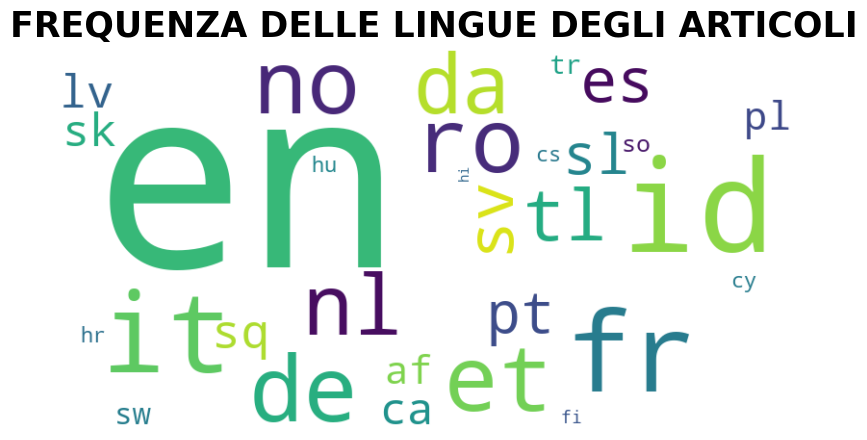

In [0]:
# Create a dictionary of language frequencies
lang_dict = dict(zip(lang_freq['language'], lang_freq['count']))

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(lang_dict)

plt.figure(figsize=(10, 5))
plt.title('FREQUENZA DELLE LINGUE DEGLI ARTICOLI', fontsize=25, fontweight='bold')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# BIBLIOGRAFIA
1. [Removing stopwords from text with saprk nlp](https://www.johnsnowlabs.com/text-cleaning-removing-stopwords-from-text-with-spark-nlp/)
2. [Multi class classification](https://medium.com/data-science/multi-class-text-classification-with-pyspark-7d78d022ed35)
3. [Language detector](https://medium.com/@monigrancharov/text-language-detection-with-python-beb49d9667b3)